In [1]:
import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import unicodecsv as csv
import seaborn as sns
from cycler import cycler
from textwrap import wrap
from IPython.display import display, HTML, Markdown

# Analysize variables.

In [2]:
# Read documentation.
columns_file = r"../records_documentation.txt"

with open(columns_file,"r") as f:
    columns = f.readlines()
columns
        

['[Column 0] ID\n',
 '[Column 1] Birth year: deduced from education history, where available\n',
 '[Column 2] Gender flag: 1=female, 2=male, 0=unknown\n',
 '[Column 3] Skillset1: primary skillset deduced from self-reported skills\n',
 '[Column 4] Skillset1 weight: the extent to which primary skillset is representative of overall self-reported skills\n',
 '[Column 5] Skillset2: secondary skillset deduced from self-reported skills\n',
 '[Column 6] Skillset2 weight: the extent to which secondary skillset is representative of overall self-reported skills\n',
 '[Column 7] City of profile (does not change): where unavailable, the field is left blank\n',
 '[Column 8] Country of Profile (does not change)\n',
 '[Column 9] Education (highest degree attained): 0=none/unknown; 1=high school; 2=vocational degree; 3=associateÕs; 4=bachelorÕs; 5=masterÕs other than MBA; 6=MBA; 7=doctorate (PhD/JD/MD) [NB: Romanian names not covered]\n',
 "[Column 10] Elite institution: a flag indicating whether any o

So:
- Unique identifier: ID.
- Variable Groups:
    - Column 0-10, profile info; 
    - Column 11-28, employment or education info; (c26 = False or True)
        - Column 11-18, general info;
        - Column 19-25, company info;
        - Column 27-28, school info.

In [3]:
# Define an iterator for reading rows.
def rows_iter(index=True):
    if index:
        for index, (line, ticker) in enumerate(rows_iter(index=False)):
             yield index, line, ticker
    else:
        empl_path = r"../banks_big/"
        empl_file_lst = os.listdir(empl_path)
        for empl_file_name in empl_file_lst:
            empl_file = empl_path+empl_file_name
            ticker = empl_file_name[:-4].upper()
            with open(empl_file,"rb") as f:
                reader = csv.reader(f,encoding='utf-8',escapechar='',delimiter='\t')
                for line in reader:
                    del line[1]
                    yield line, ticker

In [4]:
# Get unique values for each variable.
unique_values = []
for i in range(33):
    unique_values.append(set())
# Get unique values for each variable.
for idx, line, ticker in rows_iter():
    for i in range(33):
        unique_values[i].add(line[i])
for idx, values in enumerate(unique_values):
    print("[Column {}] ".format(idx)+str(len(values)))

[Column 0] 997405
[Column 1] 84
[Column 2] 3
[Column 3] 45
[Column 4] 317263
[Column 5] 45
[Column 6] 317263
[Column 7] 12562
[Column 8] 231
[Column 9] 8
[Column 10] 2
[Column 11] 941
[Column 12] 3
[Column 13] 817
[Column 14] 3
[Column 15] 2
[Column 16] 4500
[Column 17] 2216338
[Column 18] 846
[Column 19] 1383277
[Column 20] 1186567
[Column 21] 9121
[Column 22] 275
[Column 23] 2
[Column 24] 209110
[Column 25] 729
[Column 26] 2
[Column 27] 8
[Column 28] 2
[Column 29] 1319
[Column 30] 72
[Column 31] 6548
[Column 32] 969724


In [5]:
# One block to convert data to pd.DataFrame.
entries_lst = []
for idx, line, ticker in rows_iter():
    if idx == 20: # Control number of rows.
        break
    entries_lst.append([ticker]+line)

samples_lst = entries_lst
entries_df = pd.DataFrame(data=entries_lst)
entries_df.loc[:,[18,19]]


,18,19
0,"Senior Team Member,team member,senior",
1,,
2,"Loan Administrator Officer,administrator,officer",ACCOUNTING
3,"Senior Commerical Real Estate Loan Closer,real...","OPERATIONS,ACCOUNTING"
4,"VP Technology Project Team Mgr,vice president,...",TECHNOLOGY
5,,
6,"""Bachelor’s Degree, Computer Science, First Cl...",
7,"""Master’s Degree, Computer Science, A"",Master’...",
8,"Software Trainee,software,trainee",TECHNOLOGY
9,"Assistant Software Engineer,software engineer,...",TECHNOLOGY


In [6]:
# Get an example.
entry = samples_lst[3]
for i in range(len(entry)):
    print("[Column {}] ".format(i)+entry[i])

[Column 0] BAC
[Column 1] e76ef1e8-2aa8-3558-b553-17631ee38d0b
[Column 2] 2000
[Column 3] 1
[Column 4] Banking and Finance
[Column 5] 0.7901346408350717
[Column 6] Middle Management
[Column 7] 0.13456830414964885
[Column 8] Seattle
[Column 9] United States
[Column 10] 0
[Column 11] False
[Column 12] 2013-06-01
[Column 13] True
[Column 14] None
[Column 15] False
[Column 16] True
[Column 17] 1966
[Column 18] Senior Commerical Real Estate Loan Closer,real estate,senior,closer
[Column 19] OPERATIONS,ACCOUNTING
[Column 20] HomeStreet Bank
[Column 21] homestreet
[Column 22] 
[Column 23] UNITED STATES
[Column 24] False
[Column 25] seattle, wa
[Column 26] 52
[Column 27] False
[Column 28] 
[Column 29] False
[Column 30] 
[Column 31] 
[Column 32] 
[Column 33] 1537569690827


# Aggregate employment changes to the firm-by-date level.

Definition of employment change types: When only employment records are considered, an employment change will be recognized as
- `hiring` if it changed its company to one of the two companies (Deloitte and PwC, hereafter);
- `firing` if it changed its company from one of the two companies to `TIME_OFF` and stayed in `TIME_OFF` for more than 100 days;
- `leaving` if it changed its company from one of the two companies and not recogized as `firing`.

In [7]:
# Define a class to read and process entries.
class entryProcessor:    
    
    def __init__(self, person_id, ticker=None):
        self.person_id = person_id
        self.profile = [None]*7 # "birth_year","gender","skill1","skill2","country","education_level","f_elite"
        self.employment = [None]*7 # "start_date","end_date","ticker","f_current","job_role","department", "nth_posit"
        self.ticker = ticker
        
    # Three functions to output records.
    # Varlist: Hiring/Leaving/Firing, Ticker, year-month, profile_info: [...], next_industry.
    def enter_record(self):
        return ['hiring',self.employment[2],self.employment[0]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+['',''] 
    def leave_record(self,next_industry):
        return ['leaving',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+[next_industry]+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                                 self.employment[6]]
    def fired_record(self):
        return ['firing',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                      self.employment[6]]
    
    # When id changes, record a possible leave and then clear contents.
    def reinitialize(self,entry):
        if self.employment[3]=="False":
            record = self.leave_record('')
        else:
            record = None
        self.__init__(entry[0],self.ticker)
        self.profile = [entry[x] for x in [1,2,3,5,8,9,10]]
        if entry[6] is not None:
            self.profile[3] = '' if float(entry[6])<0.1 else entry[5]
        return record
    
    # Main method: read and process.
    def read(self,entry,ticker):
        record = []
        self.ticker = ticker
        # Reinitialize when id changes.
        if self.person_id != entry[0]:
            leave_last = self.reinitialize(entry)
            if leave_last is not None:
                record.append(leave_last)
        # Then deal with the current entry.
        if entry[3] != "-1" and entry[26] == "False":
            if self.employment[2] != entry[21]:
                if self.employment[2] == self.ticker:
                    if entry[25] == "TIME_OFF" and int(entry[16]) > 100:
                        record.append(self.fired_record())
                    else:
                        record.append(self.leave_record(entry[25]))
                self.employment = [None]*7
                if entry[21] == self.ticker:
                    self.employment[0] = entryProcessor.convert_time(entry[11],entry[12])
                    self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                    self.employment[2] = entry[21]
                    self.employment[3] = entry[15]
                    self.employment[4] = entry[17]
                    self.employment[5] = entry[18]
                    self.employment[6] = 0
                    record.append(self.enter_record())
            else:
                self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                self.employment[3] = entry[15]
                self.employment[6] += 1
        return record
            
    # Unbound methods.
    def convert_time(date,f_valid_month):
        date_regex = re.match(r"(\d{4})-(\d{2})-\d{2}",date)
        if date_regex is None:
            return None
            #raise ValueError('Not a proper date: {}'.format(date))
        else:
            return date_regex.group(1)+('00' if f_valid_month == 'False' else date_regex.group(2))
    
    def time_diff(end_date,start_date):
        if end_date is not None and start_date is not None:
            edt, sdt = int(end_date), int(start_date)
            yr_diff = edt//100-sdt//100
            emth = edt%100
            smth = sdt%100
            if not yr_diff and not (emth and smth):
                return min(6,(emth-smth-1)%12+1)
            else:
                return yr_diff*12+(emth if emth else 6)-(smth if smth else 6)
        else:
            return np.nan
        
    # For print.
    def __str__(self):
        return "[person_id: {}, profile: {}, employment: {}]".format(self.person_id, self.profile, self.employment)
            
#entry = entryProcessor(None)
#for i in range(50):
#    print(i)
#    print(entry.read(samples_lst[i]))
#    print(entry)

In [8]:
# Read, Identify & Aggregate.

## Initialize.
career = entryProcessor(None)

## Iterate.
empl_changes_lst = []
for idx, entry, ticker in itertools.chain(rows_iter(),[(None,[None]*33,"")]):
    if idx == np.inf: # End point.
        break
    ticker = {"BAC":"BAC","CITI":"C","GS":"GS","JPM":"JPM","MS":"MS","WFC":"WFC","":None}[ticker]
    empl_change_this = career.read(entry, ticker)
    if empl_change_this != []:
        empl_changes_lst += empl_change_this

varlist = [
    "type","ticker","yrmth","birth","gender","skill1","skill2","cntry","edu","f_elite",
    "job_role","depmt","ind_next","tenure","nprom"
]
empl_changes_df = pd.DataFrame(data=empl_changes_lst,columns=varlist)
empl_changes_df


,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
0,hiring,BAC,198910,2000,1,Banking and Finance,Middle Management,United States,0,False,"Loan Administrator Officer,administrator,officer",ACCOUNTING,,,
1,leaving,BAC,201306,2000,1,Banking and Finance,Middle Management,United States,0,False,"Loan Administrator Officer,administrator,officer",ACCOUNTING,52,284,0
2,hiring,BAC,200601,1985,1,Accounting and Auditing,Banking and Finance,Australia,4,True,"Investment Banking Analyst (Co-op),banking,ana...",ACCOUNTING,,,
3,leaving,BAC,200604,1985,1,Accounting and Auditing,Banking and Finance,Australia,4,True,"Investment Banking Analyst (Co-op),banking,ana...",ACCOUNTING,324110,3,0
4,hiring,BAC,201209,1968,0,Web Development,Software Engineering,United States,5,False,"Vice President/Programmer Prof Mkts,prof",,,,
5,leaving,BAC,201605,1968,0,Web Development,Software Engineering,United States,5,False,"Vice President/Programmer Prof Mkts,prof",,52,44,0
6,hiring,BAC,201200,1985,1,Banking and Finance,,United States,4,False,"Small Business Banker Vice President,vice pres...",,,,
7,hiring,BAC,201000,1987,1,Banking and Finance,Administration,United States,4,False,"Bankruptcy Lead,lead",,,,
8,leaving,BAC,201602,1987,1,Banking and Finance,Administration,United States,4,False,"Bankruptcy Lead,lead",,52,68,1
9,hiring,BAC,200600,1973,1,Non-Profit and Community,Healthcare,United States,5,False,"Business Account Manager,account manager,business",,,,


# Summarize and plot.

**For all positions in:**
- **BAC**: Bank of America.
- **C**: Citibank.
- **GS**: Goldman Sachs.
- **JPM**: JPMorgan Chase.
- **MS**: Morgan Stanley.
- **WFC**: Wells Fargo.

In [9]:
# Colors.
color_styles = ['g','r','c','m','y']
line_styles = ['-','--','-']
marker_styles = ['o','^','^']

In [10]:
# Deal with 'yrmth'.
empl_changes_df = empl_changes_df.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)

empl_changes_df.describe(include=[np.object])

,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
count,667202,667202,650712,667202,667202,667202,667202,667202,667202,667202,667202,667202,667202,658924,667202
unique,3,6,764,84,3,44,45,203,8,2,152702,408,541,540,15
top,hiring,C,200700,2000,2,Banking and Finance,,United States,4,False,"Vice President,vice president",,,,
freq,381791,171926,5457,125230,299934,218804,190083,445563,329626,601736,15094,331708,487772,381791,381791


## Count the number of employees from Dec., 1989 on.

Note: 
- This block counts the number of currently employed accountants for the two firms by calculating the cumulative sums of the net employment increase, that is, hiring minus the sum of firing and leaving.
- This method is not effective for the early years. However, if we can assure that we have all the resumes of accountants after some time, we will have the correct number after all the accountants employed before that time have left the company. We assume that the number is correct after 1989 except the most recent years.
- All the numbers are counted in the end of the year and will be used to calculate the proportion of the employment changes for next year. Note that we do not calculate monthly employment separately since there are a good proportion of our data with invalid months.

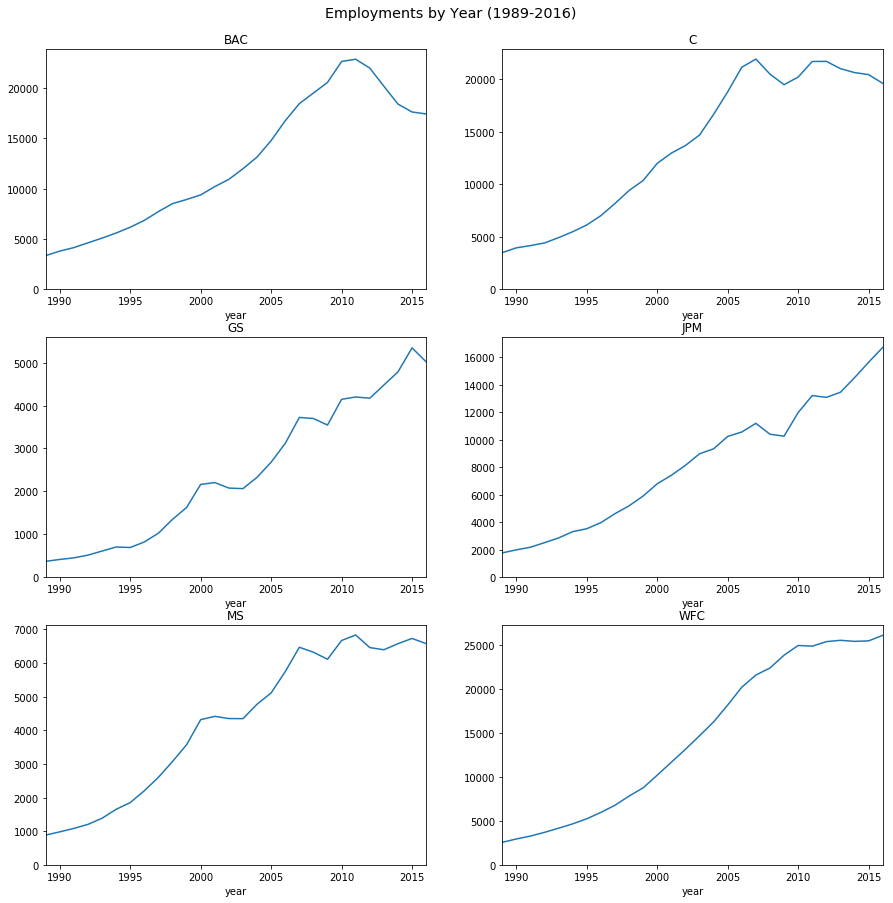

In [11]:
count_by_years = pd.DataFrame({'count':empl_changes_df.groupby(['ticker','type','year']).size()}).reset_index()
empl_by_years = count_by_years.groupby(['ticker','type']).apply(
    lambda df:df.sort_values(['year']).assign(cumsum = lambda df2:df2['count'].cumsum()) # Calculate cumsum.
).reset_index(drop=True).pivot_table(
    index=['ticker','year'],columns='type',values=['cumsum'],fill_value=0 # Reshape to wide format.
).assign(
    employment=lambda df:(df['cumsum']['hiring']-df['cumsum']['firing']-df['cumsum']['leaving']) # Get employment.
).drop('cumsum',axis=1).reset_index()
empl_by_years.columns = empl_by_years.columns.droplevel('type')

# Plot.
fig, axs = plt.subplots(3,2,figsize=(15,15))
fig.suptitle("Employments by Year (1989-2016)", fontsize="x-large",y=0.92)
for (ticker, col), ax in zip(
    empl_by_years.pivot_table(
        index='year',columns='ticker',values='employment',fill_value=0
    ).loc[lambda df:(df.index>=1989)&(df.index<=2016)].iteritems(),
    itertools.chain.from_iterable(axs)
):
    col.plot(ax=ax, title=ticker).set_ylim(bottom=0)
plt.show()

## Overall trends.
Note: Plots by year and plots by months do not only differ in frequency, but also in sample size. This is due to the entries without valid month record.

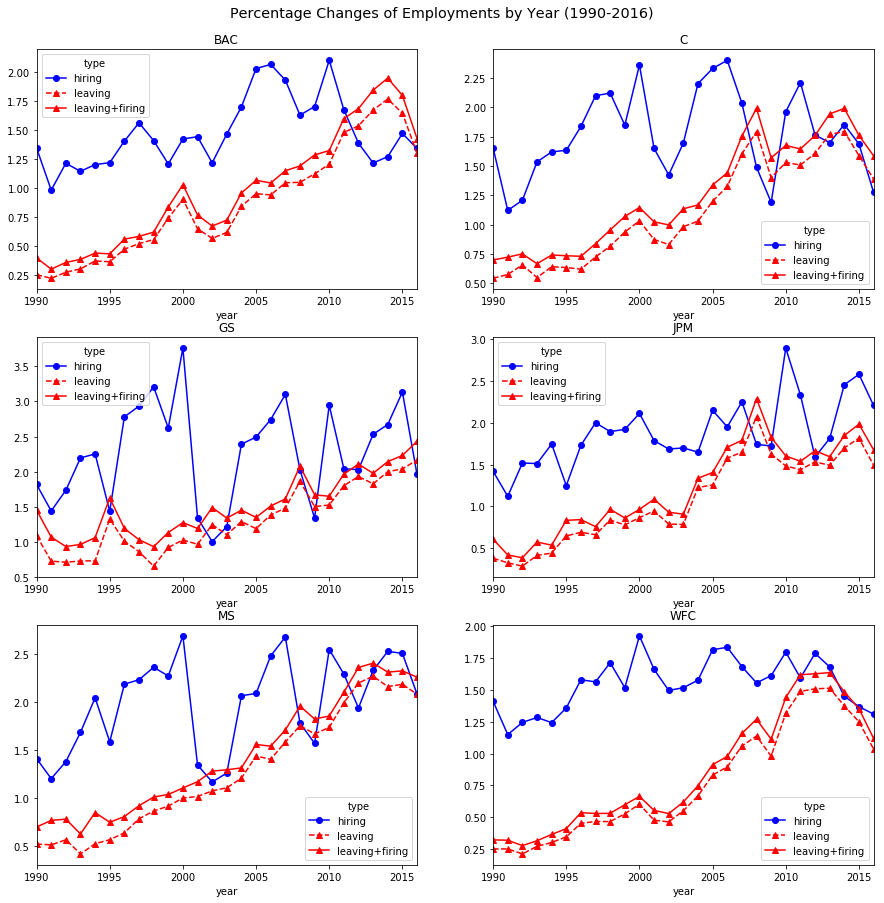

In [12]:
# Count and calculate percentages of employment changes.
prop_by_months = pd.DataFrame(
    {'count':empl_changes_df.groupby(['ticker','type','year','month']).size()} # Count by month.
).reset_index().merge(
    right=empl_by_years.assign(year_1L=lambda df:df.year+1)[['ticker','year_1L','employment']],
    left_on = ['ticker','year'], right_on = ['ticker','year_1L'] # Merge with last year's employment.
).assign(
    prop=lambda df:df['count']/df['employment']*100 # Calculate proportions.
).drop(
    ['count','year_1L','employment'],axis=1 # Drop unnecessary variables.
).loc[lambda df:(df.year>=1990)&(df.year<=2016)] # Keep only [1990, 2016] segment.

# Plot by year.
fig, axs = plt.subplots(3,2,figsize=(15,15))
fig.suptitle("Percentage Changes of Employments by Year (1990-2016)", fontsize="x-large",y=0.92)
for (ticker, grp), ax in zip(
    prop_by_months.pivot_table(
        index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{"leaving+firing":lambda df:df.leaving+df.firing}
    ).drop("firing",axis=1).groupby('ticker'),
    itertools.chain.from_iterable(axs)
):
    grp.drop('ticker',axis=1).loc[lambda df:df.year>=1990].set_index('year').plot(
        ax=ax, title=ticker, xticks=[1990,1995,2000,2005,2010,2015], xlim=(1990,2016), style=['b-o','r--^','r-^']
    )
plt.show()

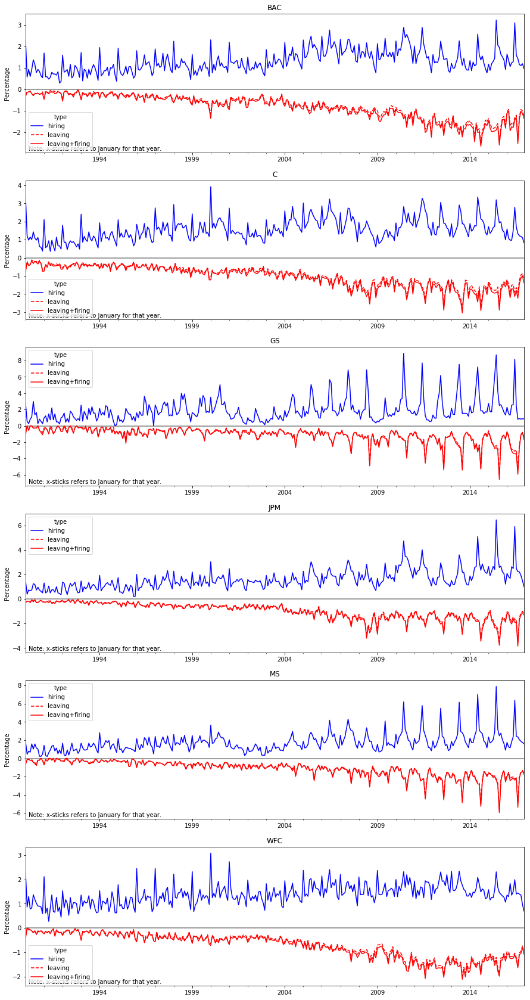

In [13]:
start_year=1990
end_year=2016
fig, axs = plt.subplots(6,1,figsize=(15,30))
for (ticker, grp),ax in zip(
    prop_by_months.loc[lambda df:(df.month!=0)&(df.year>=start_year)&(df.year<=end_year)].pivot_table(
        index = ['ticker','year','month'], columns='type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{
            "leaving+firing":lambda df:-(df.leaving+df.firing),
            "leaving":lambda df:-df.leaving,
            "yrmth":lambda df:pd.PeriodIndex(year=df.year,month=df.month,freq='M')
        }
    ).set_index('yrmth').groupby('ticker'),
    axs
):
    grp.loc[lambda df:df.year>=1990][['hiring','leaving','leaving+firing']].plot(
        ax=ax,title=ticker,style=['b-','r--','r-'],
        xlim=(pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016))),
        #xticks=[pd.Period('{}-01'.format(int(x*5+1990))) for x in range(5)]
    )
    ax.set_ylabel('Percentage')
    ax.set_xlabel('')
    ax.hlines(0,pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016)),colors='tab:gray')
    ax.annotate("Note: x-sticks refers to January for that year.",(5,3),xycoords="axes points")
plt.show()

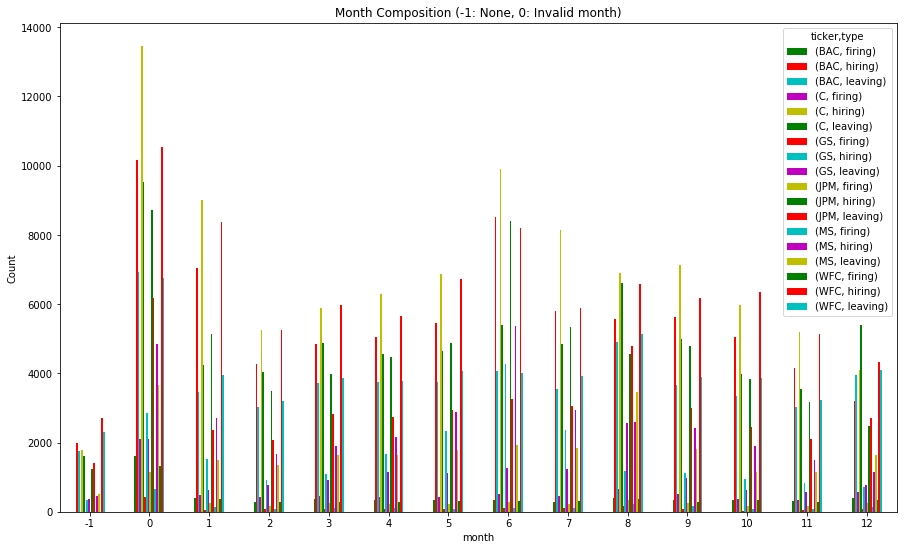

In [14]:
# Month composition.
empl_changes_df.assign(count=1).pivot_table(
    index = 'month', columns = ['ticker','type'], values='count', aggfunc='sum', fill_value=0
).plot.bar(
    figsize=(15,9),color=color_styles,rot=0,
    title="Month Composition (-1: None, 0: Invalid month)"
).set_ylabel("Count")
plt.show()

## By birth group.
Note: Birth year `2000` seems to be a trash bin for problematic records and thus will be treated the same as `None`.

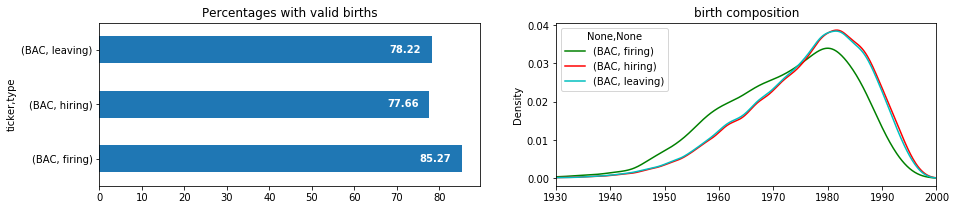

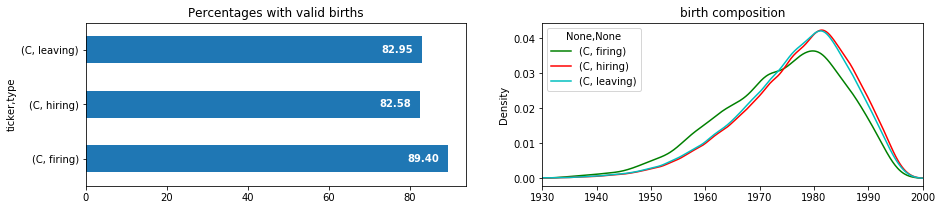

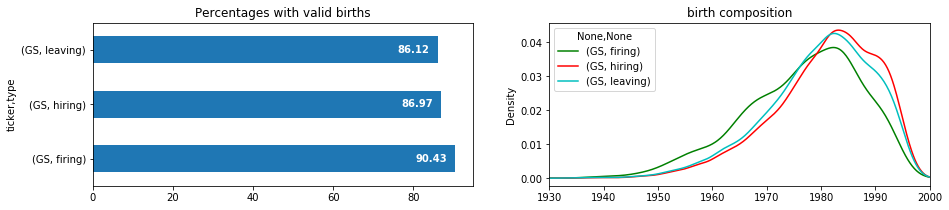

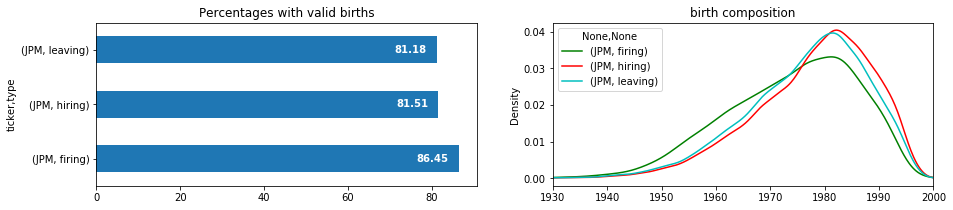

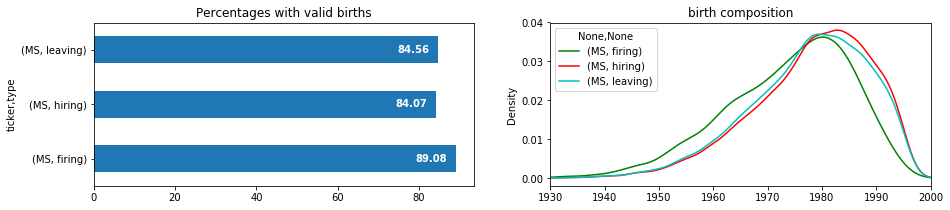

...

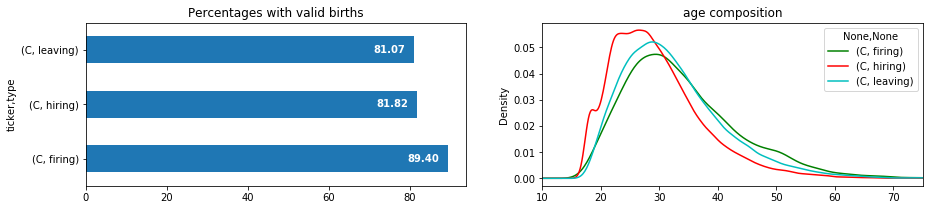

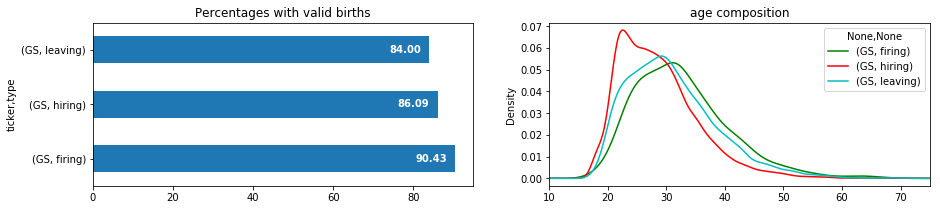

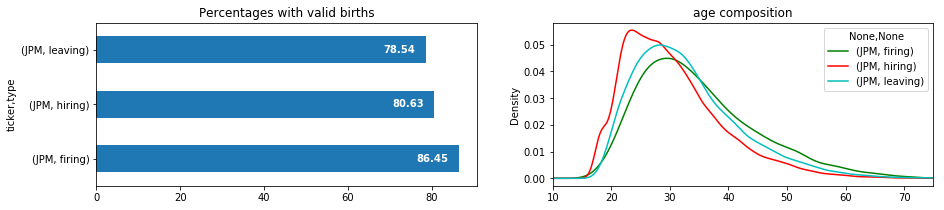

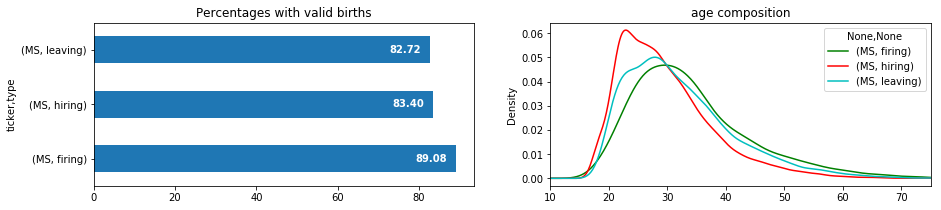

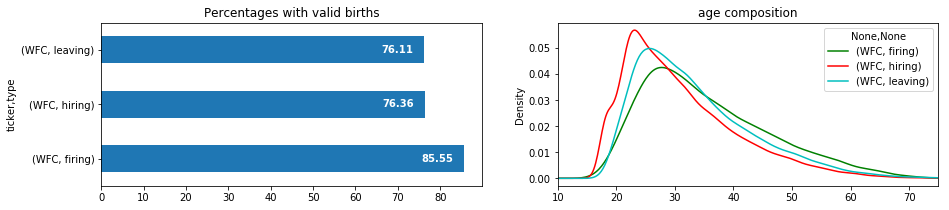

In [15]:
birth_df = empl_changes_df[['ticker','type','year','birth']]
birth_df = birth_df.assign(
    birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
    age = lambda df:(df.year-df.birth)
)

# Define a routine to generate plots.
var, xlim = "birth", (1930,2000)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()
var, xlim = "age", (10,75)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()

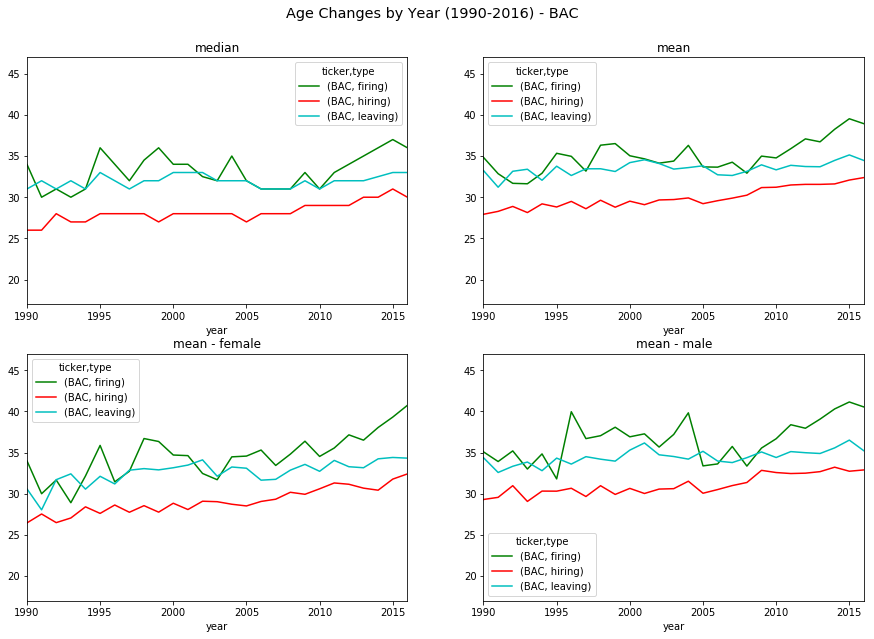

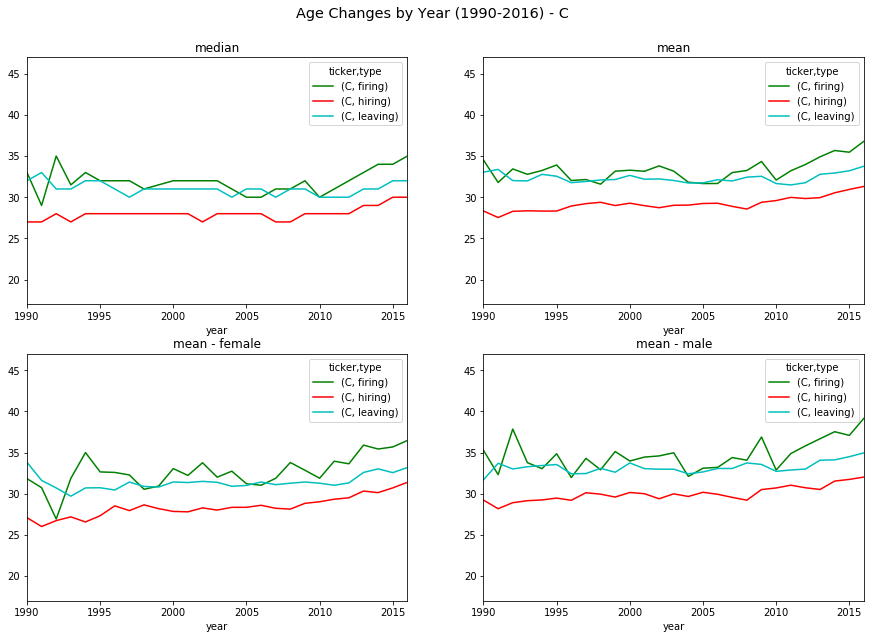

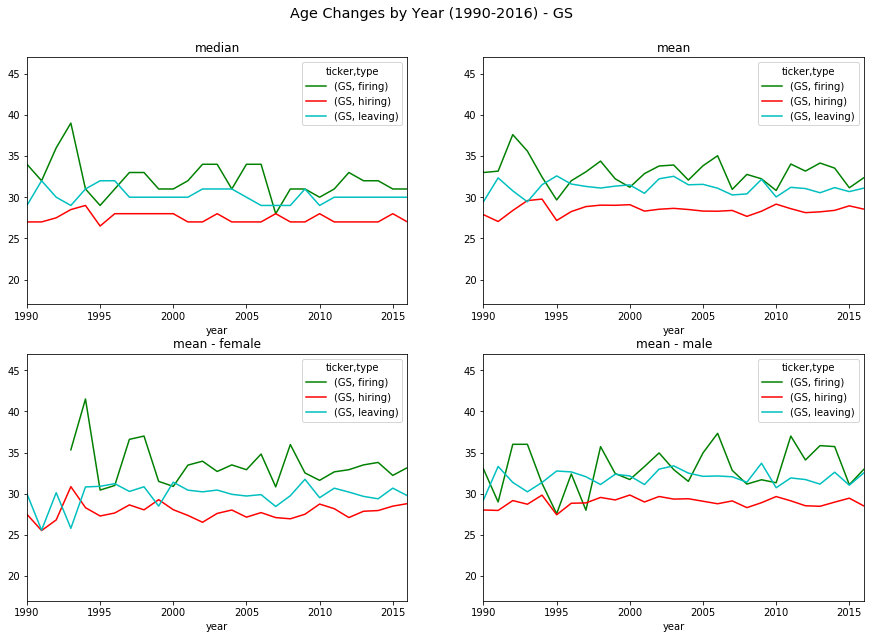

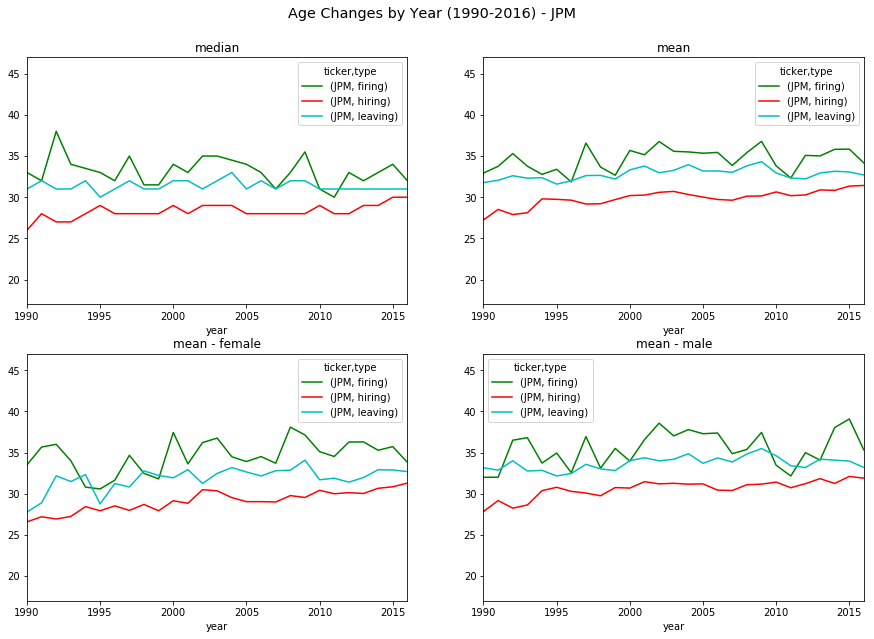

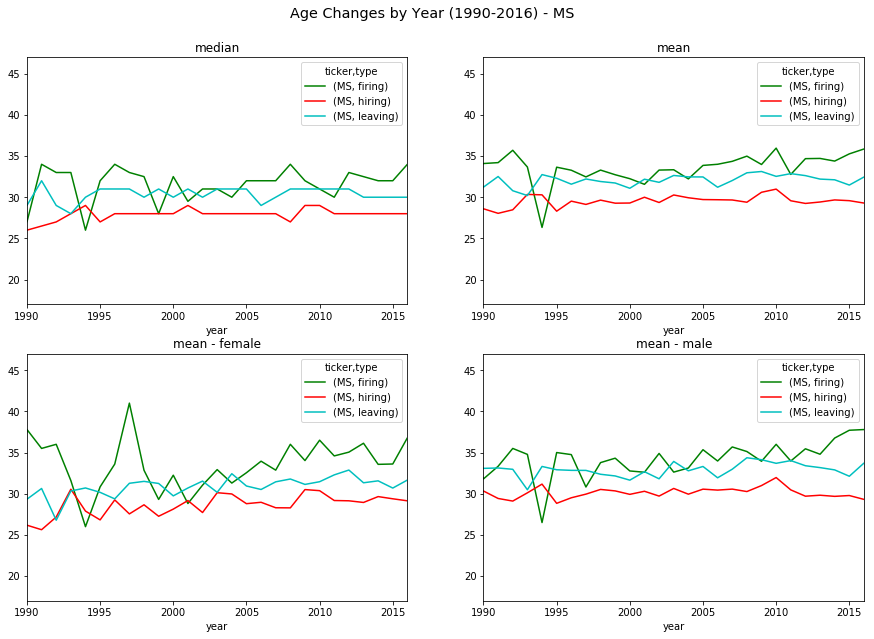

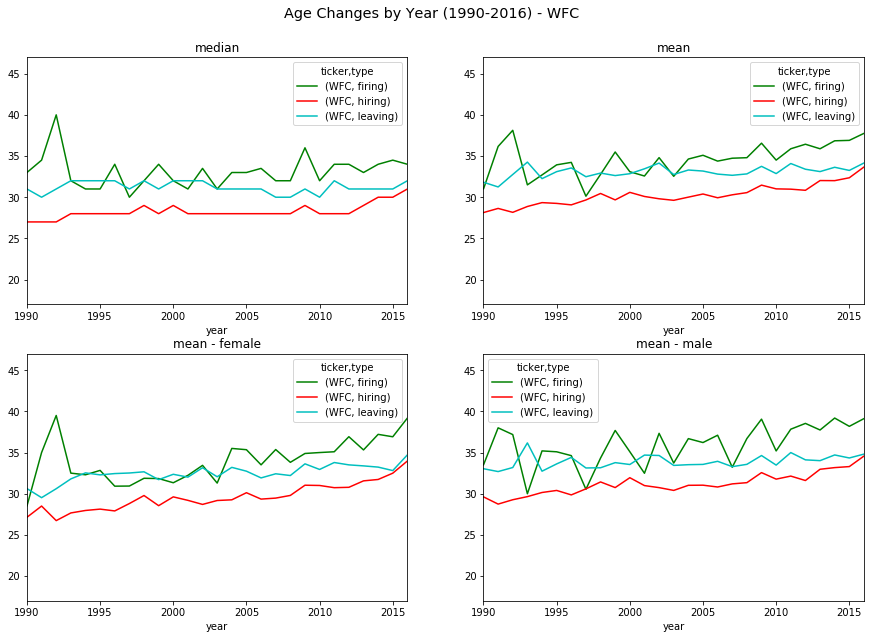

In [16]:
# Age changes by year.
for (ticker, grp) in birth_df.groupby('ticker'):
    fig, ((ax11, ax12), (ax21, ax22))=plt.subplots(2,2,figsize=(15,10))
    fig.suptitle('Age Changes by Year (1990-2016) - {}'.format(ticker),fontsize='x-large',y=0.95)
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='median'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax11,title='median')
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax12,title='mean')
    grp.loc[empl_changes_df.gender=='1'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax21,title='mean - female')
    grp.loc[empl_changes_df.gender=='2'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax22,title='mean - male')
    plt.show()

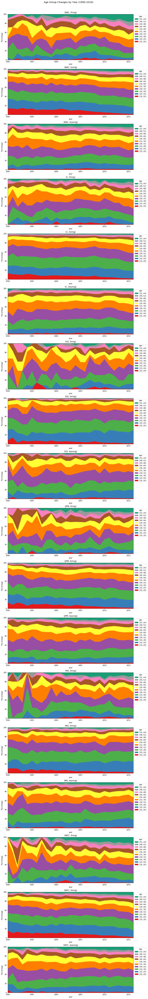

In [17]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Age Group Changes by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=pd.cut(grp.age, bins, right=False, labels=False), values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""),xlim=(1990,2016),
        color=[colormap_unif[int(float(i))] for i in to_plot.columns],
        xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title='age'
    )
plt.show()

## By Gender.

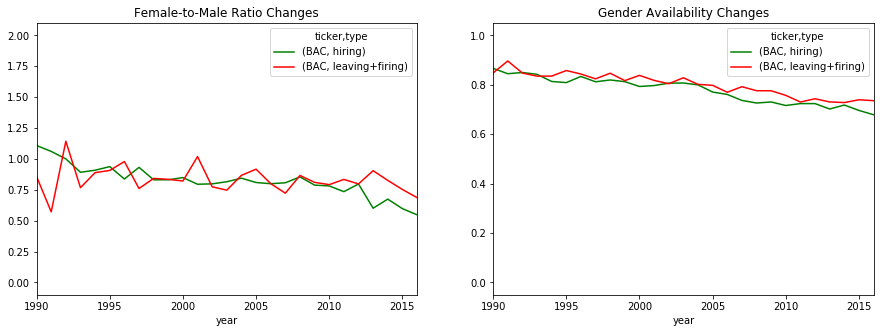

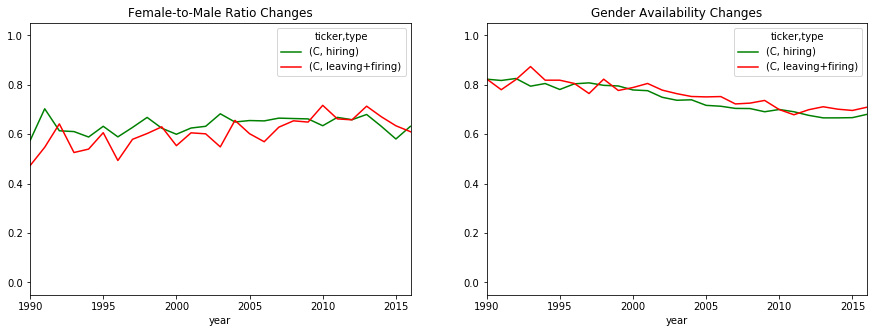

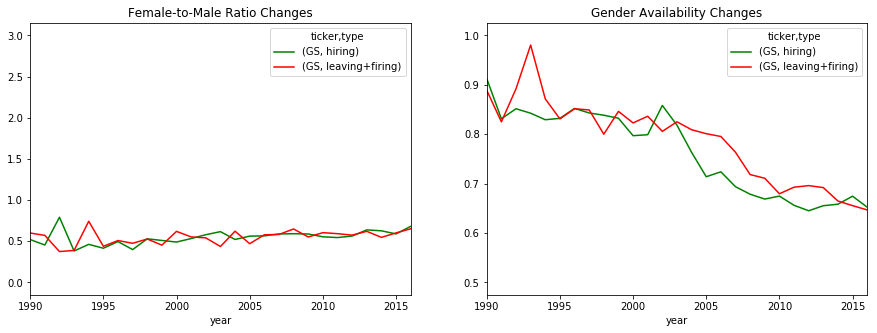

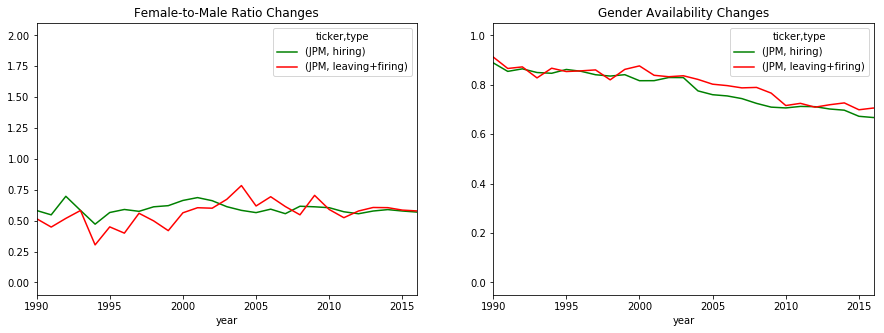

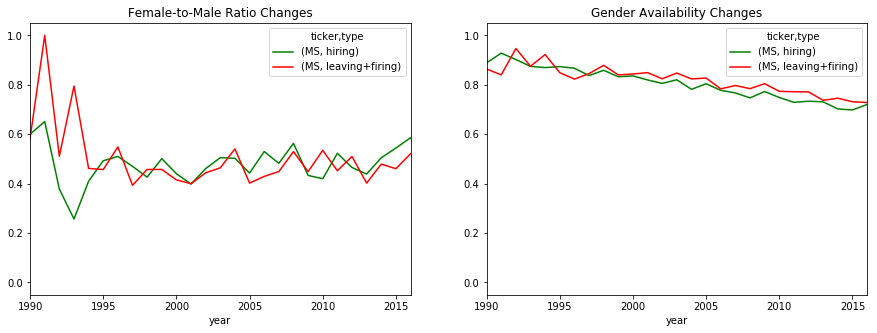

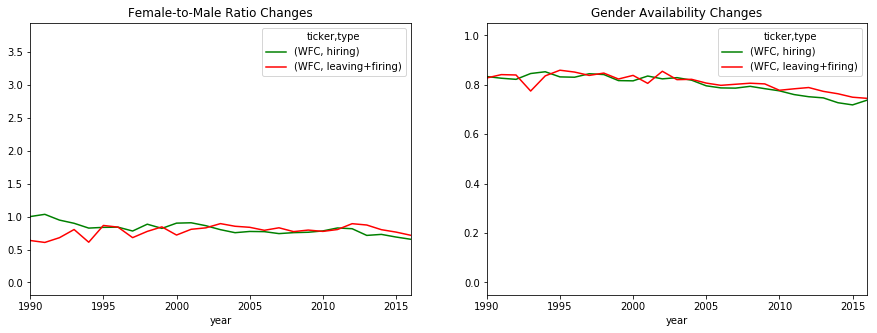

In [18]:
for ticker, grp in empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
).groupby('ticker'):
    fig, (ax1, ax2)=plt.subplots(1,2,figsize=(15,5))
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x=='1').sum()/(x=='2').sum() if (x=='2').sum() else np.nan)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Female-to-Male Ratio Changes",ax=ax1,
        xticks=[1990+5*x for x in range(6)]
    )
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x!='0').sum()/x.size)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Gender Availability Changes",ax=ax2,
        xticks=[1990+5*x for x in range(6)]
    )
    plt.show()

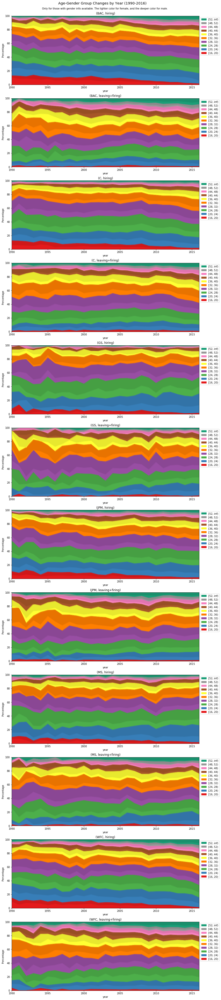

In [19]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age-Gender Group Changes by Year (1990-2016)", fontsize='x-large', y=0.891)
fig.text(0.25,0.885,
         "Only for those with gender info available. The lighter color for female, and the deeper color for male.")
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(empl_changes_df.gender!='0'), ['ticker','type','year','age']
    ].replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
    ).groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=[pd.cut(grp.age, bins, right=False, labels=False), empl_changes_df.gender], 
        values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990+5*x for x in range(6)],
        color=[
            colormap_unif[int(float(i))] if j=='1' else tuple(t/1.1 for t in colormap_unif[int(float(i))]) 
            for i,j in to_plot.columns
        ]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed([handles[i] for i in range(len(handles)) if i%2==0]), 
        reversed(["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in
            [re.match(r"\((\d+)\.0",labels[i]).group(1) for i in range(len(labels)) if i%2==0]
        ]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Primary Skill.

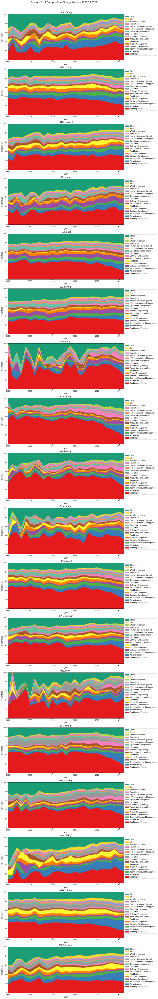

In [20]:
# Create a uniform colormap for all subplots.
skill1_ord_unif = empl_changes_df.groupby('skill1').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill1_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     empl_changes_df.loc[:].pivot_table(
#         index='skill1',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(12.5,108))
fig.suptitle("Primary Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill1']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill1_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill1_ord_unif)}[x] for x in df.skill1
        ], count = 1
    ).pivot_table(
        index='year', columns='skill1_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill1_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [21]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill1_ord_unif[i]+"</strong>"))
    to_plot = empl_changes_df.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill1==skill1_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30)
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,prop,depmt,prop,edu,prop
0,Vice President,6.87,Accounting,43.68,Bachelors,44.81
1,Analyst,5.30,Oversight,17.22,None/Unknown,20.77
2,"""",4.18,Marketing,14.04,MBA,15.79
3,Associate,3.27,Operations,7.86,Masters excl. MBA,11.98
4,Personal Banker,2.11,Business,7.60,Doctorate (PhD/JD/MD),2.71
5,Manager,2.07,Technology,4.71,Associates,1.94
6,Banking,1.64,Hr,3.07,High school,1.55
7,Senior,1.58,Legal,0.79,Vocational degree,0.46
8,Managing Director,1.48,Production,0.75,NaN,NaN
9,Specialist,1.45,Management,0.28,NaN,NaN


,job_role,depmt,edu,f_elite
168286,"Summer Analyst,analyst",,Bachelors,True
234452,"Project Leader / AVP,project leader,vice presi...",,Bachelors,True
305080,"Vice President,vice president",,None/Unknown,False
233035,"Bank Teller,bank teller",ACCOUNTING,Bachelors,False
422512,"Fund Accountant,accountant",,None/Unknown,False
35781,"Operations Analyst,operations,analyst",OPERATIONS,None/Unknown,False
476905,"Settlements Analyst Institutional Services,ana...",HR,Bachelors,False
633638,"Operations,operations",OPERATIONS,Associates,False
420486,"IM - client side,management",,Bachelors,False
10252,"Home Mortgage Consultant,home,consultant",ACCOUNTING,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Teller,6.17,Accounting,44.62,Bachelors,58.21
1,Analyst,5.44,Marketing,23.65,None/Unknown,17.18
2,Bank Teller,4.52,Operations,11.04,Masters excl. MBA,7.58
3,Intern,3.57,Hr,5.39,Associates,6.77
4,Specialist,2.93,Oversight,5.05,High school,4.83
5,Personal Banker,2.88,Business,4.14,MBA,3.14
6,Customer Service Representative,2.07,Technology,3.72,Vocational degree,1.34
7,Administrative Assistant,1.78,Legal,1.07,Doctorate (PhD/JD/MD),0.95
8,Executive Assistant,1.69,Production,1.02,NaN,NaN
9,Operations,1.37,Management,0.25,NaN,NaN


,job_role,depmt,edu,f_elite
70857,"Sales Service Representative,sales,service,rep...",MARKETING,Bachelors,False
17124,"Client Service Specialist,client,service,speci...",MARKETING,Associates,False
414643,"Claims Fraud Analyst Peer Coach,claims,analyst...","ACCOUNTING,OVERSIGHT",Bachelors,False
357693,"Summer Analyst,analyst",,Bachelors,False
16039,"Personal Teller / Commercial Teller,personal,t...",BUSINESS,Associates,False
553597,"Accountant 4,accountant",,Bachelors,False
643509,"Loss Mitigation Specialist,specialist",,Bachelors,False
269687,"Securities Processing Rep.,representative",,Bachelors,False
34024,"Credit Card Service Specialist,service,specialist","ACCOUNTING,MARKETING",None/Unknown,False
163928,"Training Specialist,training,specialist",HR,Vocational degree,False


,job_role,prop,depmt,prop,edu,prop
0,Consultant,5.30,Technology,45.31,Bachelors,49.98
1,Vice President,4.63,Accounting,11.14,None/Unknown,21.77
2,Analyst,4.31,Business,9.15,Masters excl. MBA,14.72
3,Senior,3.98,Marketing,9.04,MBA,8.70
4,Business Analyst,3.89,Operations,8.18,Associates,1.76
5,Project Manager,2.54,Production,6.34,Doctorate (PhD/JD/MD),1.51
6,"""",2.48,Oversight,5.47,High school,1.10
7,Developer,2.10,Hr,2.82,Vocational degree,0.45
8,Business,2.09,Legal,2.05,NaN,NaN
9,Manager,2.06,Tehnology,0.29,NaN,NaN


,job_role,depmt,edu,f_elite
41778,Microstrategy Developer/Analyst,,Masters excl. MBA,False
535342,"Sr. ETL Analyst,senior executive,team leader,a...",,Bachelors,False
120443,"UI and .Net Framework Consultant,consultant",,Bachelors,False
385383,"Corporate Development Program Analyst,developm...",BUSINESS,Masters excl. MBA,True
77753,"Operations Representative; Military Bank,opera...","OPERATIONS,ACCOUNTING",Bachelors,False
372119,"Systems Consultant,consultant",TECHNOLOGY,Masters excl. MBA,False
593496,"Analytics Consultant,consultant",BUSINESS,Masters excl. MBA,False
159584,"Sr. Developer from Exzac,senior,developer",,Bachelors,False
297877,"Finance Analyst,finance,analyst",ACCOUNTING,Bachelors,False
251783,"IT Business Analyst,business analyst,it",TECHNOLOGY,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Analyst,5.82,Accounting,40.21,Bachelors,48.28
1,Intern,3.79,Marketing,23.66,None/Unknown,17.77
2,"""",2.09,Operations,8.23,Masters excl. MBA,14.57
3,Teller,1.85,Business,7.68,MBA,12.75
4,Associate,1.60,Technology,6.61,High school,2.13
5,Vice President,1.59,Oversight,6.13,Associates,1.84
6,Gerente,1.58,Hr,4.83,Doctorate (PhD/JD/MD),1.73
7,Personal Banker,1.53,Legal,1.24,Vocational degree,0.94
8,Specialist,1.44,Production,0.79,NaN,NaN
9,Banking,1.37,Management,0.59,NaN,NaN


,job_role,depmt,edu,f_elite
348082,"Estagiário,estagiário",,Bachelors,False
178112,"Database Officer,officer",,Masters excl. MBA,False
301757,"Controllers Summer Intern,summer intern",,None/Unknown,False
250239,"Intern - CRM Program,intern,client,management",,MBA,False
568843,"Customer Service Representative,customer servi...",MARKETING,Bachelors,False
244552,"Personal Banker,personal banker",,Bachelors,False
284136,"Personal Banker,personal banker",,Bachelors,False
147604,"Vice President Global Marketing,vice president...",MARKETING,MBA,True
595817,"Business Specialist,business,specialist",,Associates,False
406169,"Treasury Services Summer Analyst,services,analyst","HR,ACCOUNTING",Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Vice President,4.60,Accounting,26.11,Bachelors,47.44
1,"""",3.83,Marketing,19.63,None/Unknown,19.53
2,Manager,3.26,Operations,19.28,MBA,14.63
3,Analyst,3.20,Oversight,8.65,Masters excl. MBA,10.99
4,Project Manager,2.24,Technology,8.31,Associates,2.72
5,Senior,1.89,Business,7.57,High school,2.07
6,Specialist,1.85,Hr,6.99,Doctorate (PhD/JD/MD),1.96
7,Operations,1.76,Production,1.83,Vocational degree,0.65
8,Consultant,1.39,Legal,0.93,NaN,NaN
9,Assistant,1.38,Management,0.68,NaN,NaN


,job_role,depmt,edu,f_elite
598210,"Brokerage Intern,intern",,Bachelors,False
931,"Associate,associate",,Masters excl. MBA,False
57056,"Vice President Senior Compliance Specialist,vi...",OVERSIGHT,Bachelors,False
639790,"Project Manager,project manager",,Bachelors,False
12365,Senior Vice President of Retail Bank Sales & O...,"OPERATIONS,MARKETING,ACCOUNTING",Bachelors,True
317247,"Summer Analyst,analyst",,Bachelors,False
391509,"Business Tech Analyst I,business,tech,analyst",,Masters excl. MBA,False
197101,"Senior Vice President/Site President,senior,pr...",,Bachelors,False
171316,"Assistant Team Leader,team leader,assistant",,None/Unknown,False
90349,"Sr. Business Control Specialist,senior,busines...",,Doctorate (PhD/JD/MD),False


## By Secondary Skill.

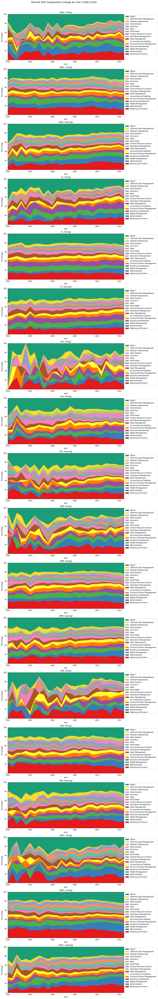

In [22]:
skill2_to_plot = empl_changes_df.loc[lambda df:df.skill2!='']

# Create a uniform colormap for all subplots.
skill2_ord_unif = skill2_to_plot.groupby('skill2').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill2_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill2_to_plot.loc[:].pivot_table(
#         index='skill2',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(12.5,108))
fig.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    skill2_to_plot.loc[lambda df:df.skill2!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill2']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill2_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill2_ord_unif)}[x] for x in df.skill2
        ], count = 1
    ).pivot_table(
        index='year', columns='skill2_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill2_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [23]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill2_ord_unif[i]+"</strong>"))
    to_plot = skill2_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill2==skill2_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,prop,depmt,prop,edu,prop
0,Vice President,4.71,Accounting,50.29,Bachelors,49.31
1,Analyst,3.99,Marketing,14.45,None/Unknown,21.14
2,"""",3.41,Oversight,8.55,Masters excl. MBA,10.97
3,Consultant,2.13,Operations,8.08,MBA,10.08
4,Associate,2.08,Technology,6.12,Associates,2.94
5,Senior,2.03,Business,5.86,Doctorate (PhD/JD/MD),2.83
6,Manager,1.99,Hr,3.92,High school,2.15
7,Financial Advisor,1.93,Legal,1.22,Vocational degree,0.58
8,Personal Banker,1.85,Production,1.09,NaN,NaN
9,Specialist,1.77,Management,0.40,NaN,NaN


,job_role,depmt,edu,f_elite
409095,Northeast Regional Sales Manager - Home Lending,MARKETING,None/Unknown,False
422964,Business Manager,,Masters excl. MBA,False
481464,360 Group Intern,,Bachelors,False
18030,Trust Officer Global Wealth & Investment Manag...,ACCOUNTING,Masters excl. MBA,False
465613,Executive Assistant,,Bachelors,False
111417,Vice President - Data Systems Security,"OPERATIONS,TECHNOLOGY",Bachelors,False
416648,Application Developer,,Masters excl. MBA,True
515007,Financial Consultant,ACCOUNTING,None/Unknown,False
416647,Application Developer,,Masters excl. MBA,True
287171,Intern,,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Teller,5.89,Accounting,44.75,Bachelors,56.03
1,Analyst,5.35,Marketing,21.91,None/Unknown,17.10
2,Bank Teller,3.98,Operations,11.02,Masters excl. MBA,9.65
3,Personal Banker,3.82,Hr,5.78,Associates,6.07
4,Specialist,3.06,Oversight,5.15,MBA,4.67
5,Intern,2.72,Technology,4.61,High school,3.91
6,Customer Service Representative,1.60,Business,3.99,Doctorate (PhD/JD/MD),1.37
7,Associate,1.53,Production,1.30,Vocational degree,1.20
8,"""",1.38,Legal,1.17,NaN,NaN
9,Operations,1.33,Management,0.29,NaN,NaN


,job_role,depmt,edu,f_elite
656088,Personal Banker,,Bachelors,False
222547,Workflow Coordinator,,Bachelors,False
216682,Financial Sales Representative,"ACCOUNTING,MARKETING",None/Unknown,False
156364,Trainee,,Masters excl. MBA,False
373273,Assistant Team Lead,,Bachelors,False
631247,Underwriter 3,,Bachelors,False
14627,Mortgage Loan Officer,ACCOUNTING,None/Unknown,False
578914,Administrative Assistant and Loan Assistant,ACCOUNTING,Vocational degree,False
38870,Compliance Specialist/Program Coordinator,OVERSIGHT,Bachelors,False
456862,Wealth Management Intern,,Masters excl. MBA,False


,job_role,prop,depmt,prop,edu,prop
0,Vice President,5.00,Accounting,29.11,Bachelors,46.49
1,"""",4.08,Marketing,17.21,None/Unknown,18.93
2,Analyst,3.14,Operations,14.74,MBA,15.66
3,Manager,2.96,Oversight,10.34,Masters excl. MBA,11.43
4,Senior,1.91,Technology,9.81,Associates,2.86
5,Associate,1.83,Hr,7.77,Doctorate (PhD/JD/MD),2.07
6,Project Manager,1.74,Business,6.99,High school,1.91
7,Specialist,1.69,Production,1.83,Vocational degree,0.65
8,Consultant,1.49,Legal,1.34,NaN,NaN
9,Operations,1.42,Management,0.81,NaN,NaN


,job_role,depmt,edu,f_elite
82197,Sr. Vice President,,MBA,False
394262,Procurement Systems Analyst/Technology Buyer,"OPERATIONS,TECHNOLOGY",Bachelors,False
399598,Vice President Quality Assurance,PRODUCTION,MBA,False
370732,VP,,MBA,True
390432,Assistant RM & Sales,MARKETING,Doctorate (PhD/JD/MD),False
104207,Senior Teller,,Masters excl. MBA,False
82084,Night Shift / Weekend Technical Support / Comp...,MARKETING,Bachelors,False
105351,Front Line Manager,,Bachelors,False
339497,Deputy Manager,,MBA,False
98190,Mortgage Technology Manager,"ACCOUNTING,TECHNOLOGY",Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Analyst,6.79,Accounting,39.97,Bachelors,49.54
1,Intern,3.88,Marketing,21.69,Masters excl. MBA,15.21
2,"""",2.77,Business,8.28,None/Unknown,14.60
3,Associate,2.22,Operations,7.69,MBA,14.29
4,Teller,1.99,Oversight,7.54,Doctorate (PhD/JD/MD),2.22
5,Vice President,1.96,Technology,7.04,High school,1.83
6,Banking,1.79,Hr,4.99,Associates,1.72
7,Specialist,1.45,Legal,1.07,Vocational degree,0.59
8,Bank Teller,1.44,Production,0.90,NaN,NaN
9,Management,1.21,Management,0.77,NaN,NaN


,job_role,depmt,edu,f_elite
207091,Desk support Latin America clients,MARKETING,Bachelors,False
106936,Underwriter,,Bachelors,False
289953,Labor Relations Manager,HR,MBA,False
414204,Vice President Brand & Marketing Services,"HR,MARKETING",Bachelors,True
32856,Marketing,MARKETING,Masters excl. MBA,False
358936,Private Banking,ACCOUNTING,Bachelors,False
419939,Vice President Investment Banking,ACCOUNTING,Bachelors,False
646209,Senior Insurance Sales Representative,"ACCOUNTING,MARKETING",Doctorate (PhD/JD/MD),False
164933,Oficial Citigold,,Bachelors,False
385310,Certified Clerical clerk,,Bachelors,False


,job_role,prop,depmt,prop,edu,prop
0,Vice President,5.48,Technology,38.95,Bachelors,48.88
1,Analyst,4.44,Accounting,14.44,None/Unknown,20.54
2,Consultant,4.14,Marketing,10.10,Masters excl. MBA,16.11
3,Project Manager,3.24,Operations,8.40,MBA,9.23
4,Senior,3.15,Production,8.39,Doctorate (PhD/JD/MD),1.84
5,"""",2.83,Oversight,7.76,Associates,1.68
6,Business Analyst,2.57,Business,6.36,High school,1.27
7,Associate,2.52,Hr,2.99,Vocational degree,0.44
8,Manager,2.22,Legal,1.71,NaN,NaN
9,Developer,1.51,Tehnology,0.67,NaN,NaN


,job_role,depmt,edu,f_elite
395201,Test Consultant,,Bachelors,False
237286,Senior Operations Specialist,OPERATIONS,Vocational degree,False
184749,Business Analyst Consumer Credit Payment Product,ACCOUNTING,Bachelors,False
131773,Associate,,MBA,True
175565,VP - Global Fraud Operations Manager,"OPERATIONS,OVERSIGHT",Bachelors,False
595219,Analytics Consultant,BUSINESS,None/Unknown,False
281879,Software Engineering Process Group,TECHNOLOGY,Bachelors,False
372075,Quality Assurance Analyst,PRODUCTION,None/Unknown,False
547773,Desktop Engineer Senior,,Bachelors,True
34473,AVP Sr QA Analyst,PRODUCTION,Bachelors,False


## By Country.

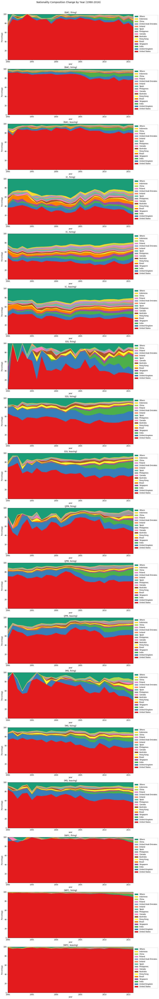

In [24]:
# Create a uniform colormap for all subplots.
cntry_ord_unif = empl_changes_df.groupby('cntry').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    cntry_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='cntry',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:28]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,rotatelabels=True,
#         color = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()


## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Nationality Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','cntry']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        cntry_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(cntry_ord_unif)}[x] for x in df.cntry
        ], count = 1
    ).pivot_table(
        index='year', columns='cntry_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [cntry_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016),xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(labels), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Education Level.

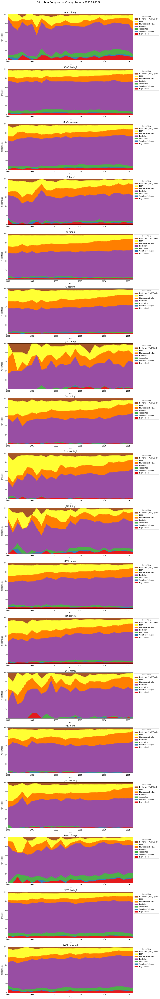

In [25]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}
colormap_unif = {str(idx):clr for idx, clr in zip(
    range(len(edu_lablst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='edu',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[edu_lablst[x] for x in range(0,8)]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(18,1,figsize=(13.5,108))
fig.suptitle("Education Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','edu']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.edu]].assign(count = 1).pivot_table(
        index='year', columns='edu', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016), xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [edu_lablst[int(x)] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Education"
    )
plt.show()



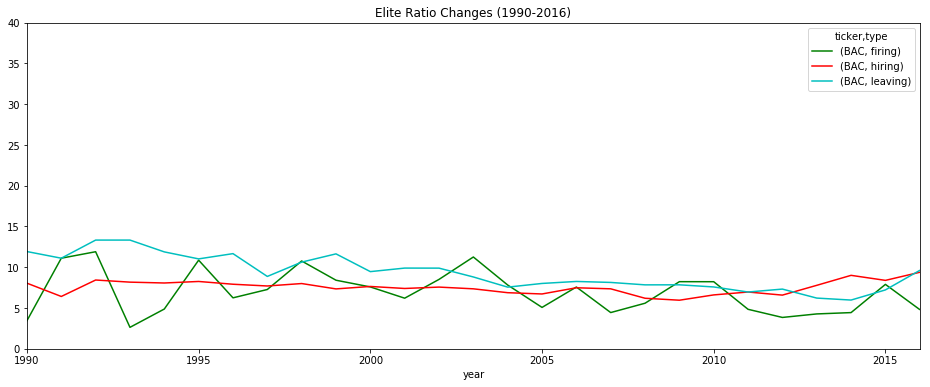

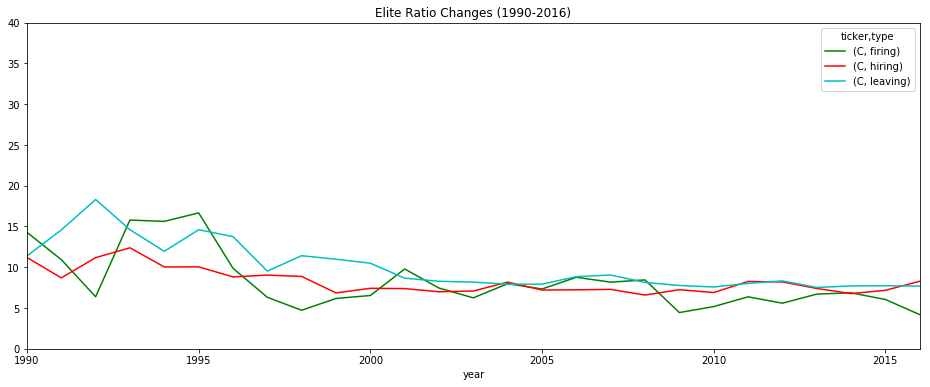

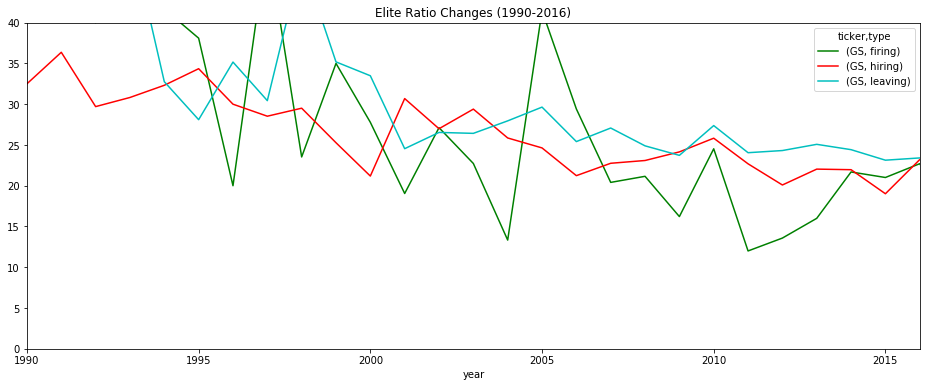

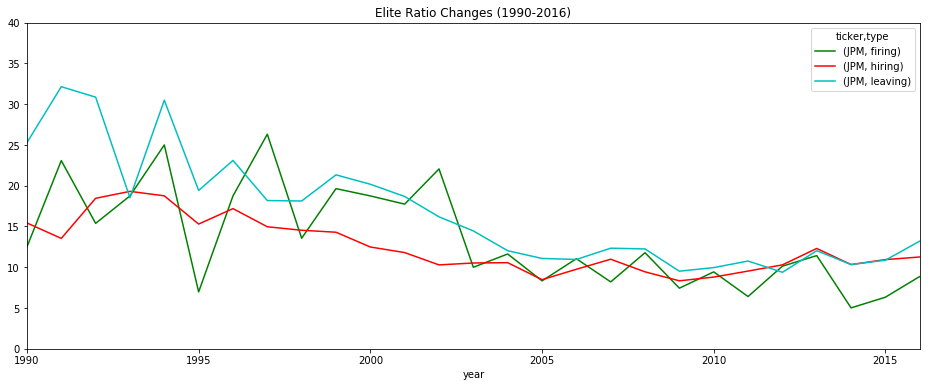

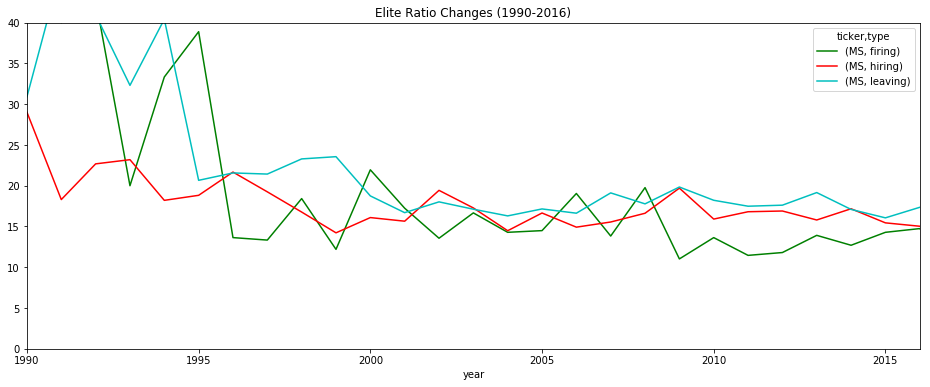

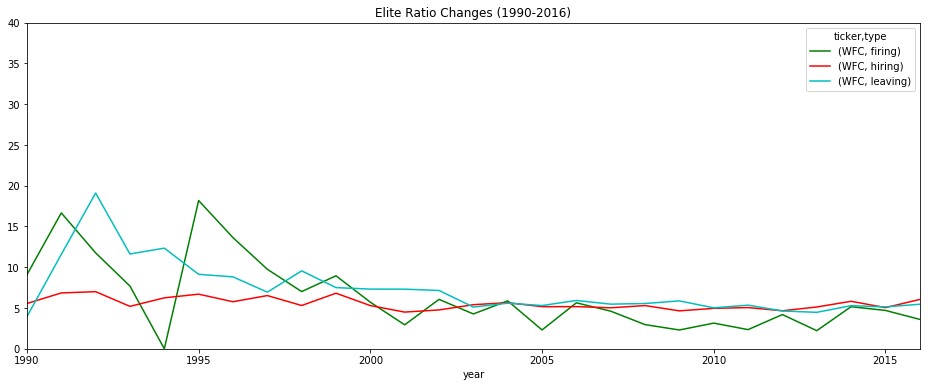

In [26]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    grp.loc[lambda df:df.year>=1990].pivot_table(
        index='year',columns=['ticker','type'],values='f_elite',
        aggfunc=lambda x:((x=='True').sum()/(x==x).sum()*100)
    ).plot(
        xlim=(1990,2016),color=color_styles,ylim=(0,40),
        title="Elite Ratio Changes (1990-2016)",figsize=(16,6)
    )
    ax.set_ylabel('Percentage')
plt.show()

# By Next Industry.

Note: Division of 2-digit NAICS's into industry groups are obtained from [Bureau of Labor Statistics](https://www.bls.gov/iag/tgs/iag_index_naics.htm).

In [27]:
NAICS2GRP_dict = {
    '11': (1, "Natural Resources and Mining"),
    '21': (1, "Natural Resources and Mining"),
    '23': (2, "Construction"),
    '31': (3, "Manufacturing"),
    '32': (3, "Manufacturing"),
    '33': (3, "Manufacturing"),
    '42': (4, "Trade, Transportation, and Utilities"),
    '44': (4, "Trade, Transportation, and Utilities"),
    '45': (4, "Trade, Transportation, and Utilities"),
    '48': (4, "Trade, Transportation, and Utilities"),
    '49': (4, "Trade, Transportation, and Utilities"),
    '22': (4, "Trade, Transportation, and Utilities"),
    '51': (5, "Information"),
    '52': (6, "Financial Activities"),
    '53': (6, "Financial Activities"),
    '54': (7, "Professional and Business Services"),
    '55': (7, "Professional and Business Services"),
    '56': (7, "Professional and Business Services"),
    '61': (8, "Education and Health Services"),
    '62': (8, "Education and Health Services"),
    '71': (9, "Leisure and Hospitality"),
    '72': (9, "Leisure and Hospitality"),
    '81': (10, "Other Services"),
    '92': (11, "Public Administration"),
    '99': (12, "Unknown/Unclassified"),
    ''  : (12, "Unknown/Unclassified"),
    'MI': (12, "Unknown/Unclassified"),
    '46': (12, "Unknown/Unclassified")
}

# Show the mappings.
pd.DataFrame(
    [[key, value[0], value[1]] for key,value in NAICS2GRP_dict.items()]
).groupby([1,2])[0].apply(lambda ser:', '.join(ser)).reset_index().drop(1,axis=1).rename(
    {2:"Industry group",0:"NAICS2"},axis=1
)

,Industry group,NAICS2
0,Natural Resources and Mining,"11, 21"
1,Construction,23
2,Manufacturing,"31, 32, 33"
3,"Trade, Transportation, and Utilities","42, 44, 45, 48, 49, 22"
4,Information,51
5,Financial Activities,"52, 53"
6,Professional and Business Services,"54, 55, 56"
7,Education and Health Services,"61, 62"
8,Leisure and Hospitality,"71, 72"
9,Other Services,81


Note: `46` seems to be a wrong NAICS2 code.

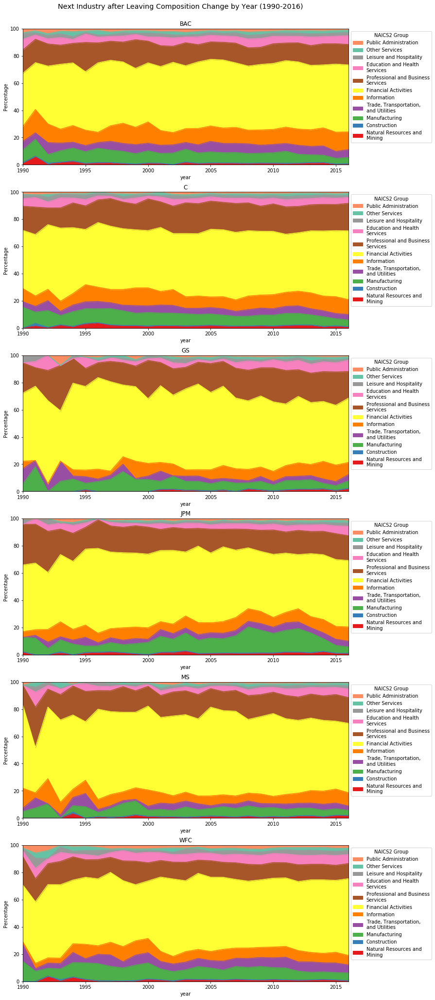

In [28]:
ind_next_lst = sorted(list(set(NAICS2GRP_dict.values())))
colormap_unif = {idx:clr for idx, clr in zip(
    ind_next_lst[:-1], # Assume the last element is "Others".
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif[ind_next_lst[-1]] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(1,2,figsize=(15,7.5))
# for (idx,col),ax in zip(empl_changes_df.loc[lambda df:df.type=='leaving'].pivot_table(
#     index=empl_changes_df.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
#     columns='ticker', values='gender', aggfunc='count'
# ).iteritems(),axs):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[x[1] for x in col.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(6,1,figsize=(12,36))
fig.suptitle("Next Industry after Leaving Composition Change by Year (1990-2016)", fontsize='x-large', y=0.90)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(df.type=='leaving'), ['ticker','type','year','ind_next']
    ].groupby('ticker'), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        columns=grp.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
        index='year', values='count', aggfunc='sum', fill_value=0
    )
    if f_none_hidden:
        to_plot.drop(ind_next_lst[-1], axis=1, inplace=True)
    to_plot = to_plot.apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=idx, xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["\n".join(wrap(re.match(r"\(\d+, (.+)\)",x).group(1),25)) for x in reversed(labels)], 
        loc='upper left', bbox_to_anchor=(1,1), title="NAICS2 Group"
    )
plt.show()

## Tenure and Number of Promotions.

Note:
- Tenure = End date of last entry - Start date of first entry in a consecutive sequence of entries in the same company;
 - When there is any invalid month in the two dates and their years are _not_ the same, the invalid month is replaced by 6;
 - When there is any invalid month in the two dates and their years are the same, the invalid month is assumed to be the extreme value (0 for start and 12 for end) and the results are the minimum of their difference and 6.
- Number of promotions = Number of entries in a consecutive sequence of entries in the same company - 1.

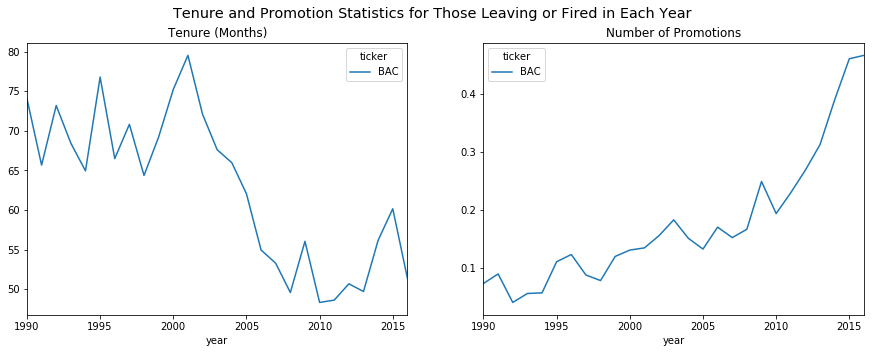

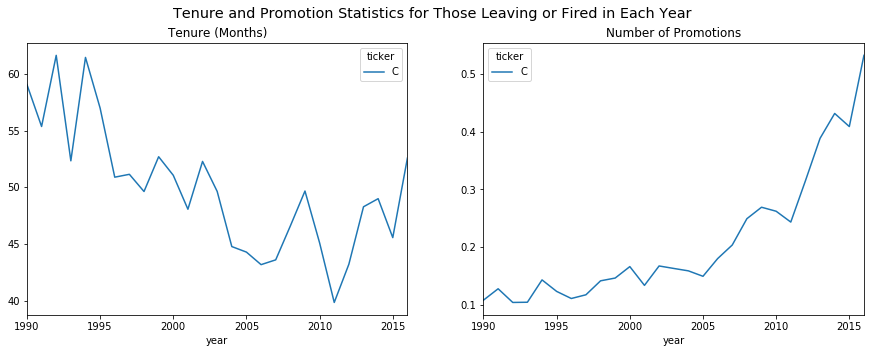

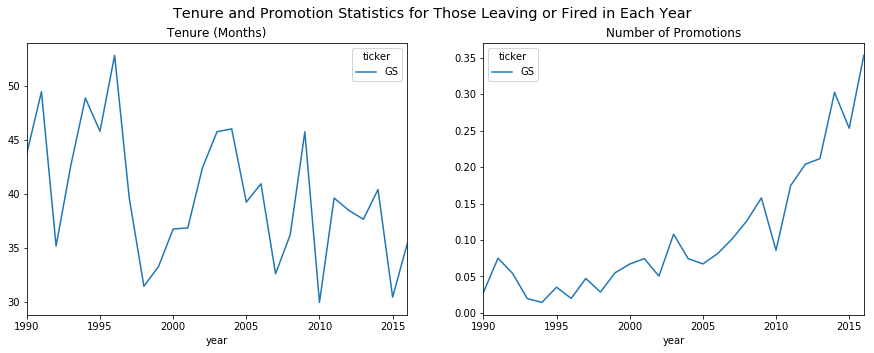

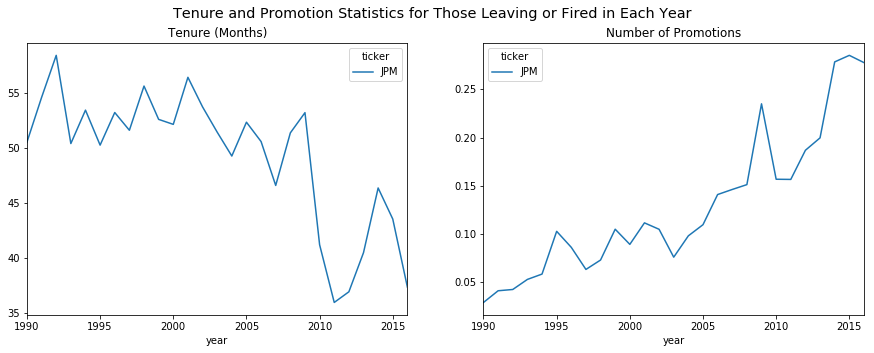

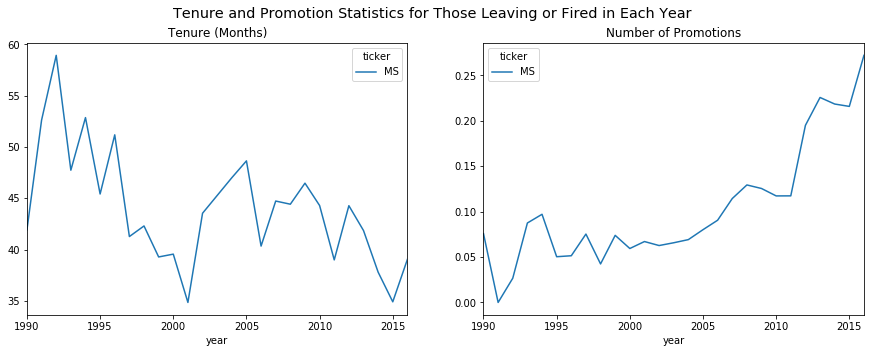

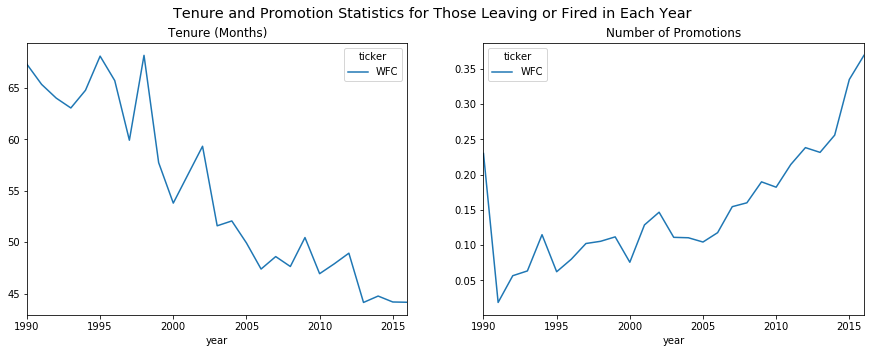

In [29]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    # Calculate.
    to_plot = grp.loc[lambda df:(df.type!='hiring')&(df.year>=1990)&(df.year<=2016)].astype(
        {'tenure':'Int64','nprom':'Int64'}
    ).pivot_table(
        columns=['ticker'],index='year',values=['tenure','nprom'],aggfunc=np.nanmean
    )

    # Plot.
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle("Tenure and Promotion Statistics for Those Leaving or Fired in Each Year",fontsize='x-large')
    to_plot['tenure'].plot(
        title="Tenure (Months)",ax=ax1,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
    to_plot['nprom'].plot(
        title="Number of Promotions",ax=ax2,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
plt.show()